In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

In [21]:
data = pd.read_csv('Parkinsson disease.csv')
data.head()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,0.02182,0.03130,0.02971,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,0.03134,0.04518,0.04368,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,0.02757,0.03858,0.03590,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,0.02924,0.04005,0.03772,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,0.03490,0.04825,0.04465,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [62]:
data.info()
display(data.describe())
print(data.shape)

<class 'pandas.core.frame.DataFrame'>
Index: 155 entries, 0 to 194
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   MDVP:Fo(Hz)     155 non-null    float64
 1   MDVP:Fhi(Hz)    155 non-null    float64
 2   MDVP:Flo(Hz)    155 non-null    float64
 3   MDVP:Jitter(%)  155 non-null    float64
 4   MDVP:PPQ        155 non-null    float64
 5   MDVP:Shimmer    155 non-null    float64
 6   MDVP:APQ        155 non-null    float64
 7   NHR             155 non-null    float64
 8   HNR             155 non-null    float64
 9   status          155 non-null    int64  
 10  RPDE            155 non-null    float64
 11  DFA             155 non-null    float64
 12  spread1         155 non-null    float64
 13  spread2         155 non-null    float64
 14  D2              155 non-null    float64
 15  PPE             155 non-null    float64
dtypes: float64(15), int64(1)
memory usage: 20.6 KB


,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:PPQ,MDVP:Shimmer,MDVP:APQ,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000,155.000000
mean,149.852065,174.542929,111.546606,0.005007,0.002786,0.026193,0.020923,0.014722,22.634897,0.774194,0.495828,0.723250,-5.799494,0.221000,2.325963,0.195778
std,38.623187,46.918423,36.285420,0.002051,0.001258,0.013201,0.010228,0.012566,3.757343,0.419468,0.105565,0.052887,0.931967,0.077342,0.354503,0.073665
min,88.333000,102.145000,65.476000,0.001680,0.000920,0.009540,0.007190,0.000650,11.866000,0.000000,0.263654,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,116.863500,131.700000,85.206000,0.003440,0.001840,0.016275,0.013095,0.005550,19.819000,1.000000,0.414039,0.684067,-6.443766,0.176621,2.056539,0.141944
50%,146.845000,163.417000,103.370000,0.004620,0.002560,0.022860,0.017970,0.010480,22.431000,1.000000,0.491345,0.727313,-5.775966,0.213353,2.316346,0.189032
75%,177.367000,210.038500,129.240000,0.006425,0.003395,0.032730,0.027545,0.019485,25.441500,1.000000,0.587562,0.761881,-5.285960,0.265680,2.538126,0.234699
max,252.455000,349.259000,221.156000,0.009970,0.007500,0.067270,0.048020,0.072230,33.047000,1.000000,0.685151,0.825069,-2.929379,0.434326,3.671155,0.430788


(155, 16)


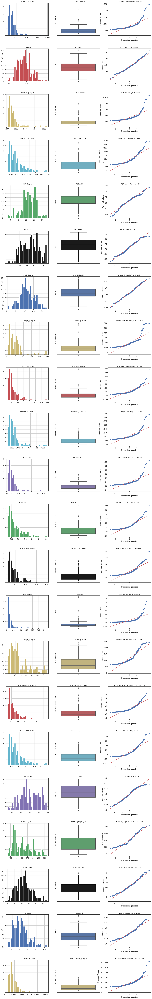

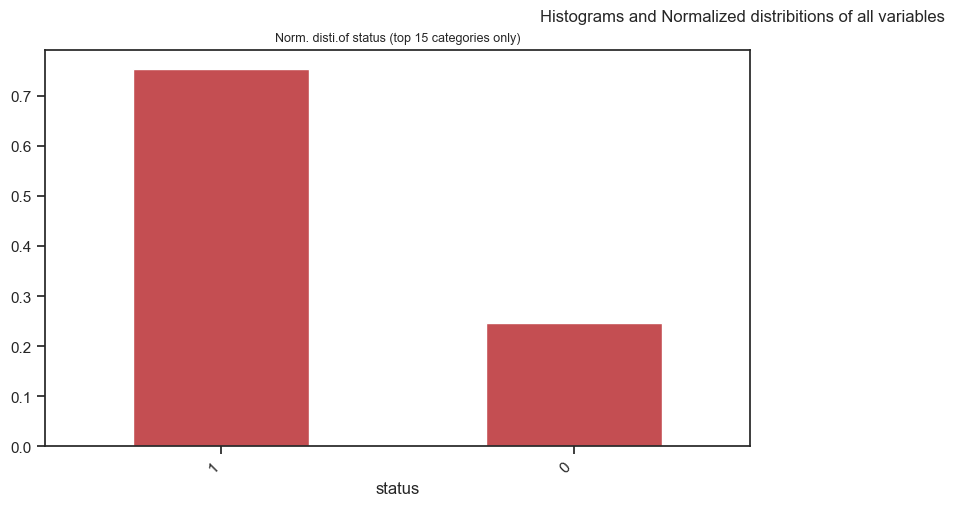

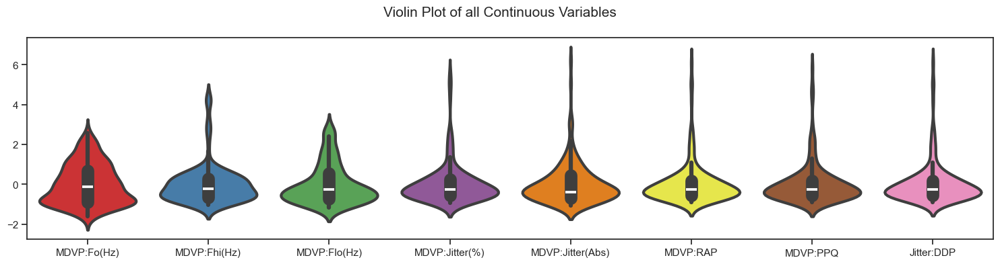

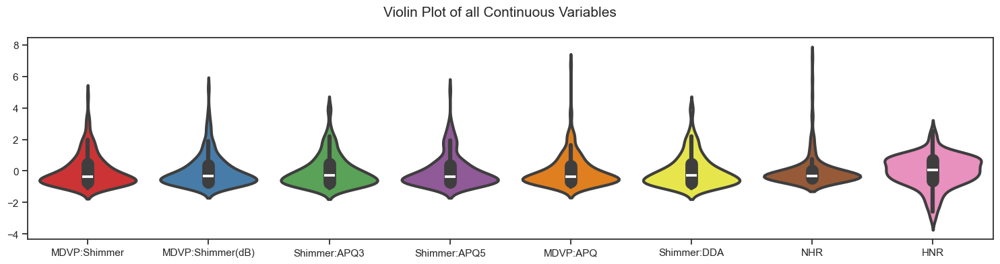

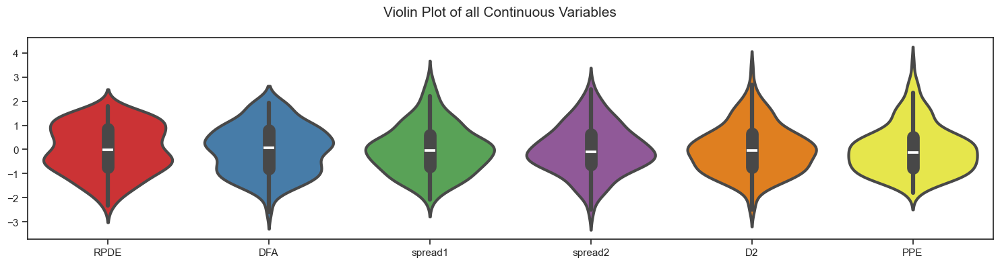

...

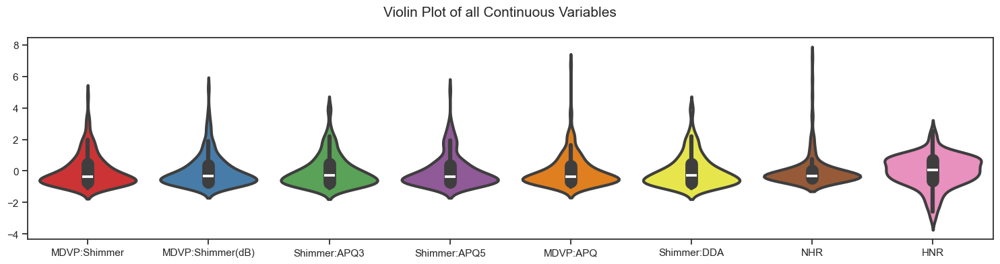

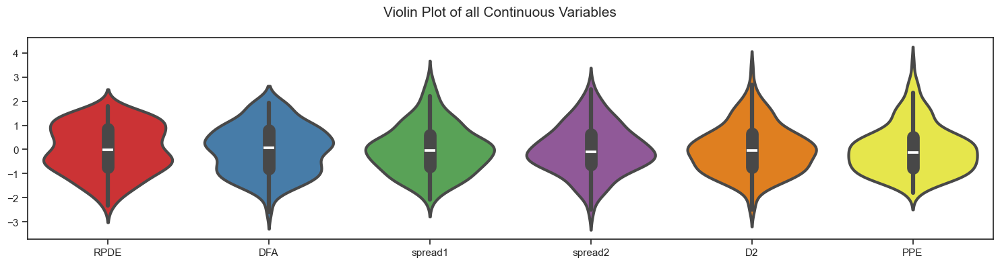

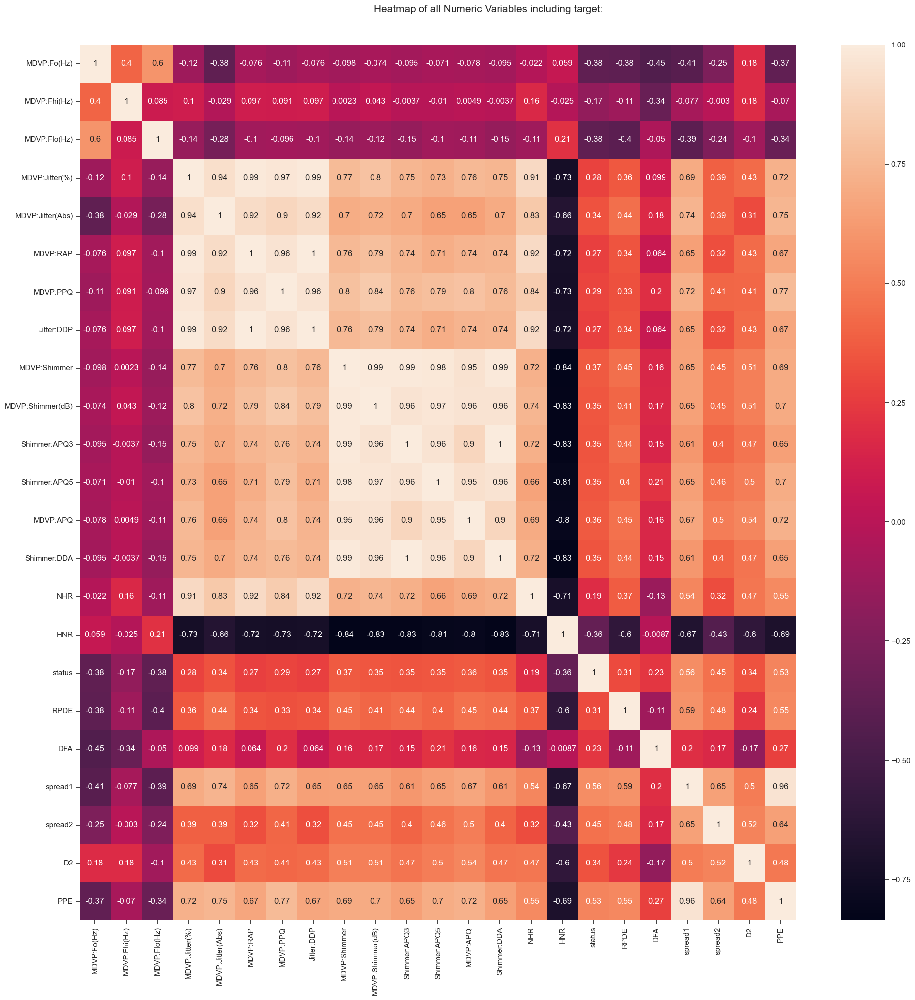

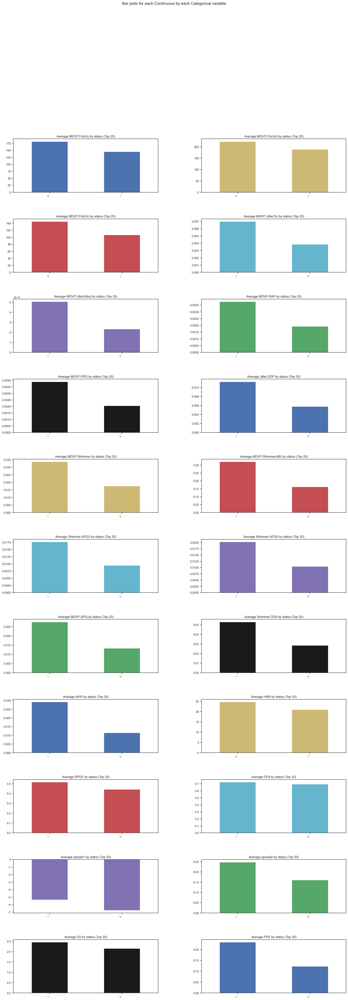

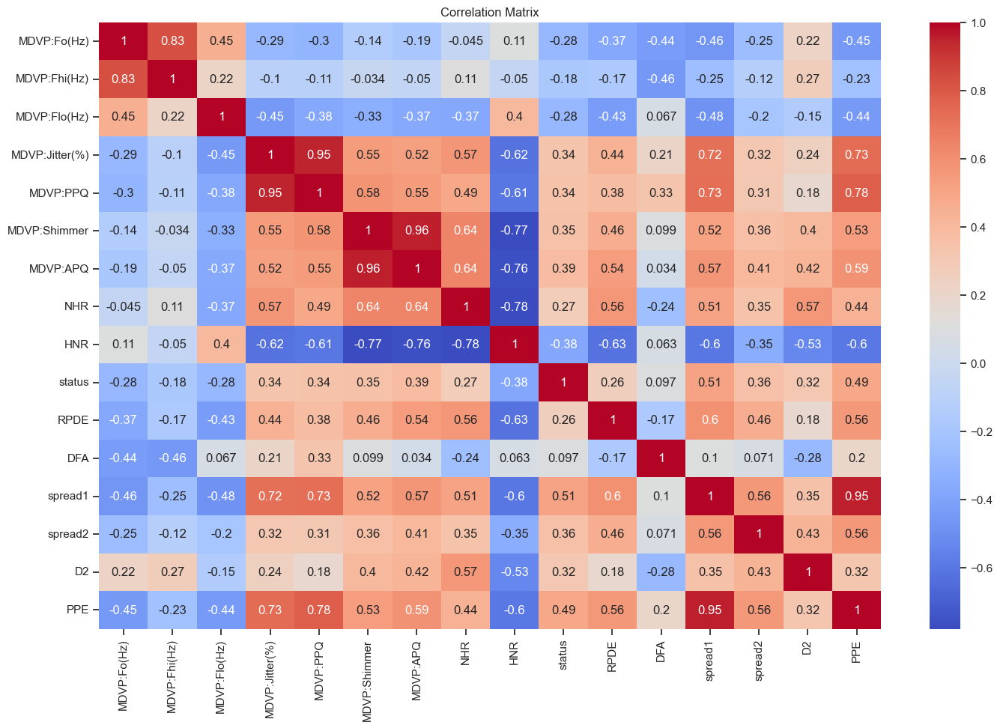

In [35]:
%matplotlib inline

df = data.select_dtypes(include=[np.number])
cor= df.corr()
plt.figure(figsize=(15,10))
sns.heatmap(cor, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [24]:
%pip install autoviz

from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()
df = AV.AutoViz('Parkinsson disease.csv')


Note: you may need to restart the kernel to use updated packages.
Shape of your Data Set loaded: (195, 24)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  22
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  1
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    24 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
name,object,0.000000,100,,,Possible ID column: drop before modeling step.
MDVP:Fo(Hz),float64,0.000000,NA,88.333000,260.105000,No issue
MDVP:Fhi(Hz),float64,0.000000,NA,102.145000,592.030000,Column has 11 outliers greater than upper bound (358.22) or lower than lower bound(0.85). Cap them or remove them.
MDVP:Flo(Hz),float64,0.000000,NA,65.476000,239.170000,Column has 9 outliers greater than upper bound (223.61) or lower than lower bound(0.70). Cap them or remove them.
MDVP:Jitter(%),float64,0.000000,NA,0.001680,0.033160,Column has 14 outliers greater than upper bound (0.01) or lower than lower bound(-0.00). Cap them or remove them.
MDVP:Jitter(Abs),float64,0.000000,NA,0.000007,0.000260,"Column has 7 outliers greater than upper bound (0.00) or lower than lower bound(-0.00). Cap them or remove them., Column has a high correlation with ['MDVP:Jitter(%)']. Consider dropping one of them."
MDVP:RAP,float64,0.000000,NA,0.000680,0.021440,"Column has 14 outliers greater than upper bound (0.01) or lower than lower bound(-0.00). Cap them or remove them., Column has a high correlation with ['MDVP:Jitter(%)', 'MDVP:Jitter(Abs)']. Consider dropping one of them."
MDVP:PPQ,float64,0.000000,NA,0.000920,0.019580,"Column has 15 outliers greater than upper bound (0.01) or lower than lower bound(-0.00). Cap them or remove them., Column has a high correlation with ['MDVP:Jitter(%)', 'MDVP:Jitter(Abs)', 'MDVP:RAP']. Consider dropping one of them."
Jitter:DDP,float64,0.000000,NA,0.002040,0.064330,"Column has 14 outliers greater than upper bound (0.02) or lower than lower bound(-0.00). Cap them or remove them., Column has a high correlation with ['MDVP:Jitter(%)', 'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ']. Consider dropping one of them."
MDVP:Shimmer,float64,0.000000,NA,0.009540,0.119080,Column has 8 outliers greater than upper bound (0.07) or lower than lower bound(-0.02). Cap them or remove them.


Number of All Scatter Plots = 253
All Plots done
Time to run AutoViz = 15 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [25]:
data.drop(columns=['name'], inplace=True)

In [26]:
lb, ub = 0.85,358.22
data = data[(data['MDVP:Fhi(Hz)'] > lb) & (data['MDVP:Fhi(Hz)'] < ub)]


In [27]:
lb, ub  = 0.70,223.61
data = data[(data['MDVP:Flo(Hz)'] > lb) & (data['MDVP:Flo(Hz)'] < ub)]

In [28]:
lb, ub = -0.00,0.01
data = data[(data['MDVP:Jitter(%)'] > lb) & (data['MDVP:Jitter(%)'] < ub)]

In [29]:
data.drop(columns = ['MDVP:Jitter(Abs)','MDVP:RAP','Jitter:DDP'], inplace = True)

In [30]:
lb ,ub = -0.00,0.01
data = data[(data['MDVP:PPQ'] > lb) & (data['MDVP:PPQ'] < ub)]

In [31]:
lb , ub = -0.02,0.07
data = data[(data['MDVP:Shimmer'] > lb) & (data['MDVP:Shimmer'] < ub)]

In [32]:
data.drop(columns = ['MDVP:Shimmer(dB)','Shimmer:APQ3','Shimmer:APQ5','Shimmer:DDA'],inplace=True)


In [33]:
lb , ub = -0.01,0.05
data = data[(data['MDVP:APQ'] > lb) & (data['MDVP:APQ'] < ub)]

In [36]:
data.isnull().sum()


MDVP:Fo(Hz)       0
MDVP:Fhi(Hz)      0
MDVP:Flo(Hz)      0
MDVP:Jitter(%)    0
MDVP:PPQ          0
MDVP:Shimmer      0
MDVP:APQ          0
NHR               0
HNR               0
status            0
RPDE              0
DFA               0
spread1           0
spread2           0
D2                0
PPE               0
dtype: int64

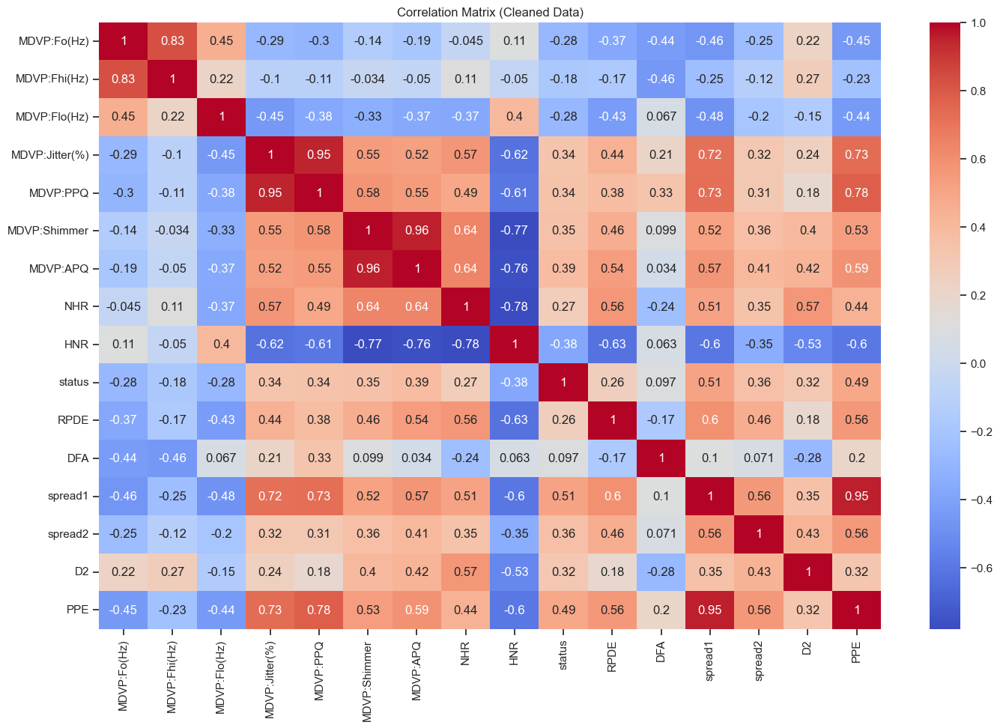

In [37]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix (Cleaned Data)')
plt.show()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:PPQ,MDVP:Shimmer,MDVP:APQ,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,119.992,157.302,74.997,0.00784,0.00554,0.04374,0.02971,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,122.400,148.650,113.819,0.00968,0.00696,0.06134,0.04368,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
3,116.676,137.871,111.366,0.00997,0.00698,0.05492,0.03772,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
5,120.552,131.162,113.787,0.00968,0.00750,0.04701,0.03243,0.01222,21.378,1,0.415564,0.825069,-4.242867,0.299111,2.187560,0.357775
6,120.267,137.244,114.820,0.00333,0.00202,0.01608,0.01351,0.00607,24.886,1,0.596040,0.764112,-5.634322,0.257682,1.854785,0.211756
7,107.332,113.840,104.315,0.00290,0.00182,0.01567,0.01256,0.00344,26.892,1,0.637420,0.763262,-6.167603,0.183721,2.064693,0.163755
8,95.730,132.068,91.754,0.00551,0.00332,0.02093,0.01717,0.01070,21.812,1,0.615551,0.773587,-5.498678,0.327769,2.322511,0.231571
9,95.056,120.103,91.226,0.00532,0.00332,0.02838,0.02444,0.01022,21.862,1,0.547037,0.798463,-5.011879,0.325996,2.432792,0.271362
10,88.333,112.240,84.072,0.00505,0.00330,0.02143,0.01892,0.01166,21.118,1,0.611137,0.776156,-5.249770,0.391002,2.407313,0.249740
11,91.904,115.871,86.292,0.00540,0.00336,0.02752,0.02214,0.01141,21.414,1,0.583390,0.792520,-4.960234,0.363566,2.642476,0.275931


In [53]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

X = data.drop(columns=['status'])
y = data['status']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
model = LogisticRegression(random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy}")
print("\nClassification Report:")
print(report)

Accuracy: 0.7419354838709677

Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.33      0.43         9
           1       0.77      0.91      0.83        22

    accuracy                           0.74        31
   macro avg       0.68      0.62      0.63        31
weighted avg       0.72      0.74      0.72        31



In [ ]:
from sklearn.ensemble import RandomForestClassifier


modell = RandomForestClassifier(n_estimators=100, random_state=42)
modell.fit(X_train, y_train)
rf = modell.predict(X_test)
accuracyscr = accuracy_score(y_test, rf)
reportscr = classification_report(y_test, rf)

print(f"Random Forest Accuracy: {accuracyscr}")
print("\nRandom Forest Classification Report:")
print(reportscr)

Random Forest Accuracy: 0.8387096774193549

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.56      0.67         9
           1       0.84      0.95      0.89        22

    accuracy                           0.84        31
   macro avg       0.84      0.76      0.78        31
weighted avg       0.84      0.84      0.83        31



In [46]:
from sklearn.ensemble import GradientBoostingClassifier 
model1 = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
model1.fit(X_train, y_train)
ygrad = model1.predict(X_test)
accuracy = accuracy_score(y_test, ygrad)
report = classification_report(y_test, ygrad)
print(f"Gradient Boosting Accuracy: {accuracy}")
print("\nGradient Boosting Classification Report:")
print(report)

Gradient Boosting Accuracy: 0.8387096774193549

Gradient Boosting Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.56      0.67         9
           1       0.84      0.95      0.89        22

    accuracy                           0.84        31
   macro avg       0.84      0.76      0.78        31
weighted avg       0.84      0.84      0.83        31



In [58]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report

param_grid = {                                                    # this with help of AI
    'n_estimators': [50, 100, 200],
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10]
}
rf = RandomForestClassifier(random_state=42)
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
gridsearch = GridSearchCV(estimator=rf, param_grid=param_grid, cv=cv, scoring='accuracy', n_jobs=-1)
gridsearch.fit(X_train, y_train)

bestmodel = gridsearch.best_estimator_
predicted = bestmodel.predict(X_test)

accuracy = accuracy_score(y_test, predicted)
report = classification_report(y_test,predicted)

print("Best Hyperparameters found by GridSearchCV:")
print(gridsearch.best_params_)
print("\nCross-validated accuracy score:")
print(f"{gridsearch.best_score_:.2f}")

print(f"Tuned Random Forest Accuracy: {accuracy}")
print("\nClassification Report:")
print(report)

Best Hyperparameters found by GridSearchCV:
{'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 50}

Cross-validated accuracy score:
0.89
Tuned Random Forest Accuracy: 0.8387096774193549

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.56      0.67         9
           1       0.84      0.95      0.89        22

    accuracy                           0.84        31
   macro avg       0.84      0.76      0.78        31
weighted avg       0.84      0.84      0.83        31



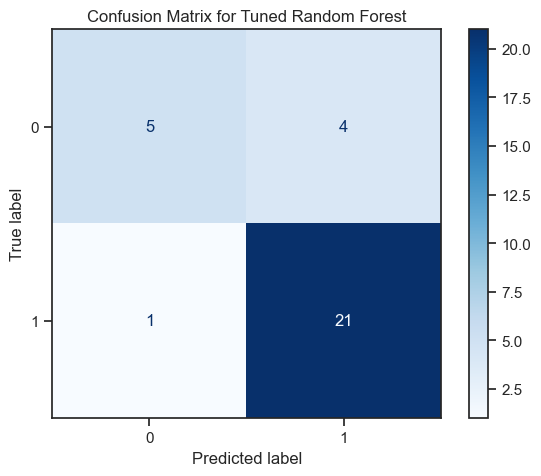

In [59]:
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, predicted)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=bestmodel.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Tuned Random Forest')
plt.show()

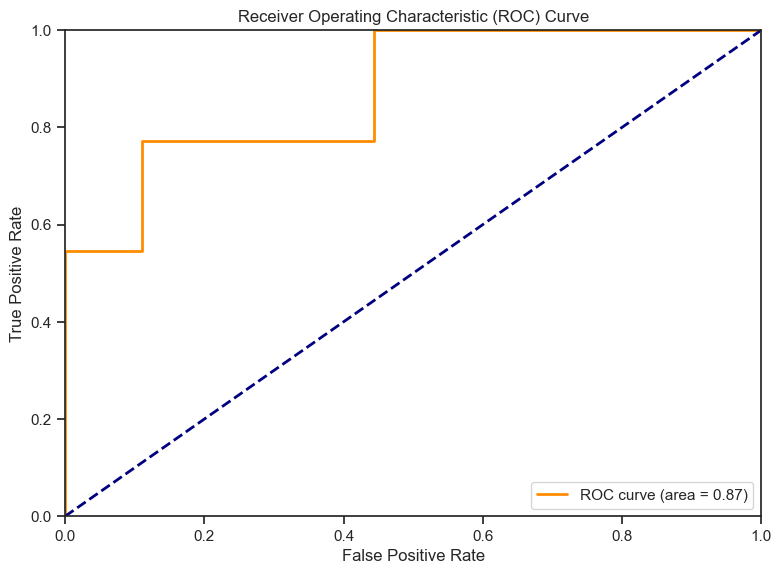

In [ ]:
from sklearn.metrics import roc_curve, auc

fpr, tpr, thresholds = roc_curve(y_test, bestmodel.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()